In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/coco2017/"
x = load(os.path.join(path, 'train2017/train2017/000000000072.jpg'))
print(x.shape)

(640, 427, 3)


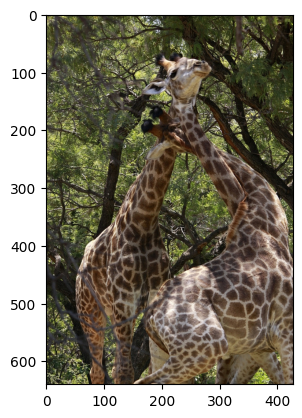

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

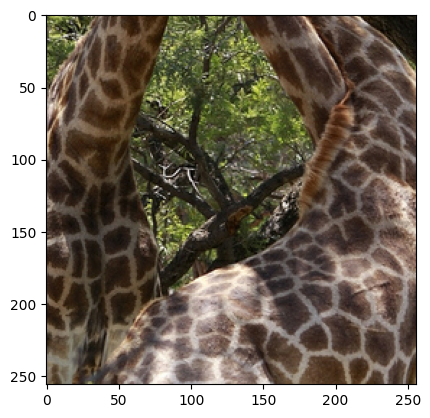

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

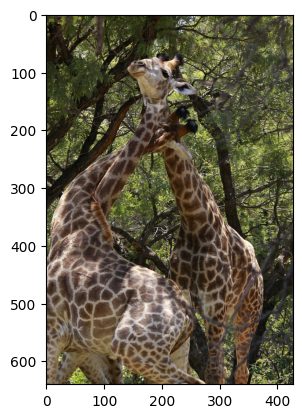

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

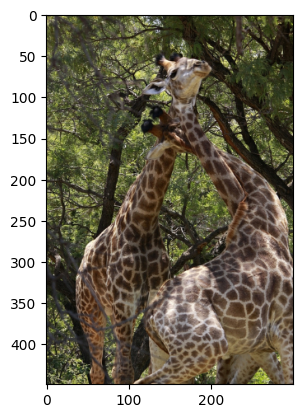

In [16]:
plt.imshow(resize_with_aspect_ratio(x,300)/255)

In [17]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 300)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [18]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [19]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [20]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "train2017/train2017/*.jpg")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.take(8000)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset.cardinality().numpy()

500

In [21]:
# create input pipeline
val = tf.data.Dataset.list_files(path + "val2017/val2017/*.jpg")
val = val.map(load_test_image)
val = val.take(1000)
val = val.shuffle(10).batch(BATCH_SIZE)
val.cardinality().numpy()

63

In [22]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [23]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 320, 214, 3)


In [24]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 640, 428, 3)


In [25]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

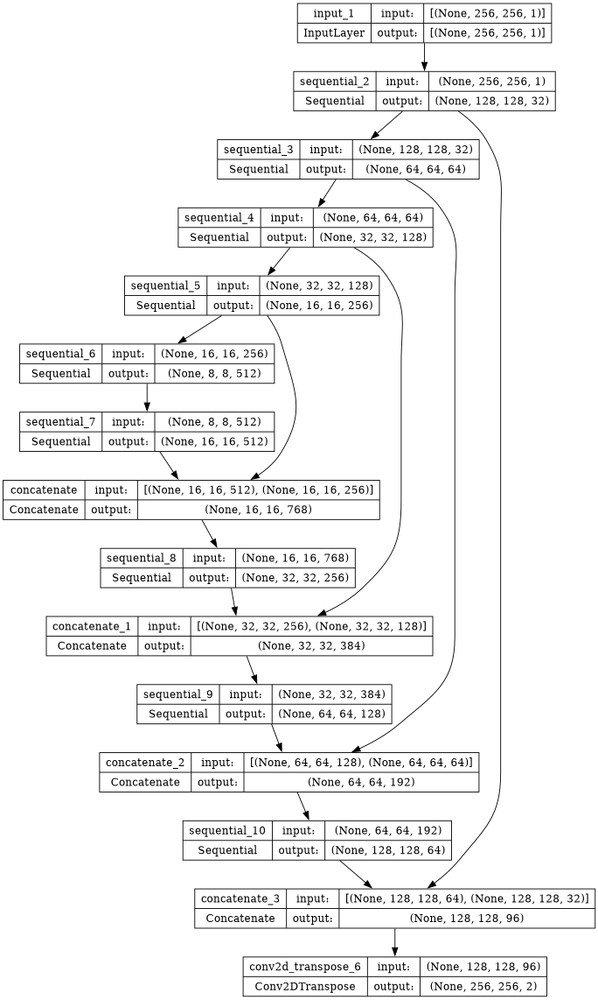

In [26]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [27]:
gen.load_weights('/kaggle/input/feb28-coco/modelsFeb7/gen_weight.keras')

In [28]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

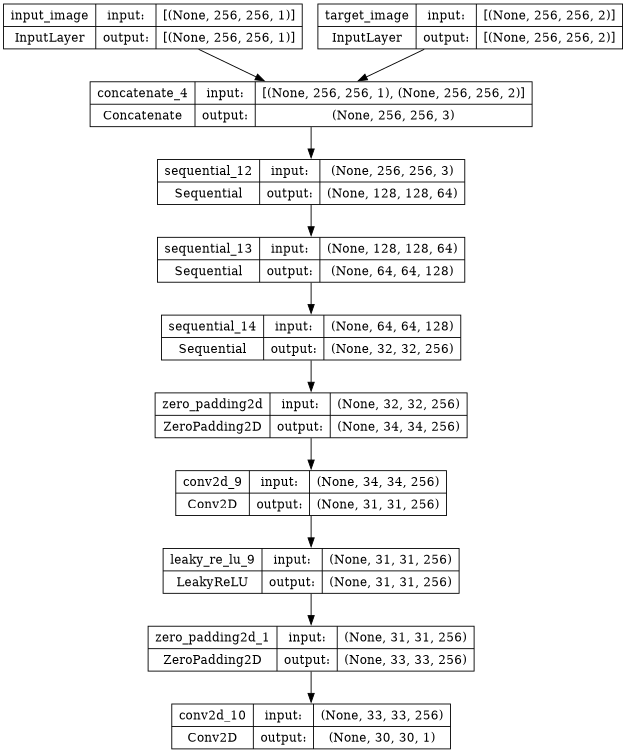

In [29]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [30]:
disc.load_weights('/kaggle/input/feb28-coco/modelsFeb7/disc_wweight.keras')

In [31]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [32]:
LAMBDA = 150

In [33]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [34]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 150*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [35]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [36]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [37]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [38]:
epochs = 250

In [39]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [40]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [41]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [42]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [43]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [44]:
os.mkdir('/kaggle/working/gen_output/')

In [45]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [46]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


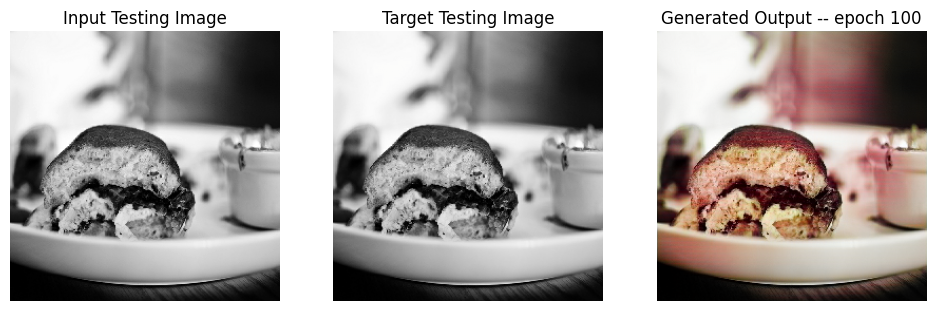

SSIM Score: 0.9432189464569092
PSNR Score: 22.131649017333984


In [47]:
display_random_test_image(gen, '/kaggle/input/coco2017/val2017/val2017/000000001425.jpg',100)

In [48]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 41000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/coco2017/val2017/val2017/000000001425.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [49]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 1s 0us/step
Training Details
Generator-- total_loss:9.14251 gan_loss:1.07159 l1_loss:0.04527 perceptual_loss:0.00853 Discriminator-- total_loss:1.45121 real_loss:0.70255 generated_loss:0.74866 --- SSIM 0.89763 PSNR 22.38021 LPIPS 0.00000
Time taken for epoch 1 is 606.7430834770203 sec
Number of iteration 500
Validation Details
Generator-- total_loss:16.50808 gan_loss:0.42937 l1_loss:0.09436  perceptual_loss:0.01283 Discriminator-- total_loss:1.66280 real_loss:1.29339 generated_loss:0.36941 --- SSIM 0.70391 PSNR 15.04502 LPIPS 0.00000
Time taken for epoch 1 is 649.2688593864441 sec
Number of iteration 63
Displaying one random test image...


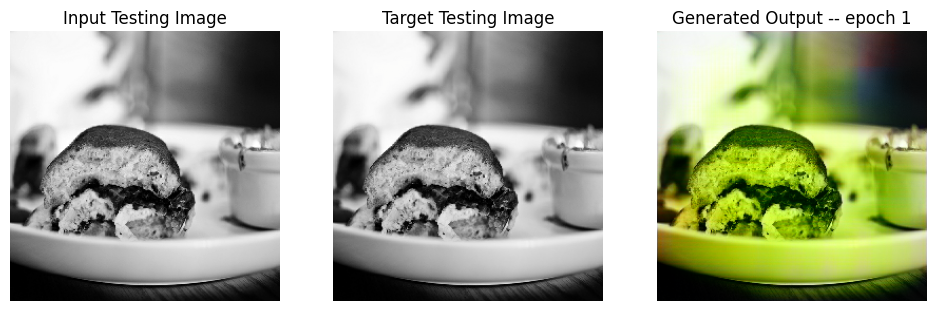

SSIM Score: 0.7803497910499573
PSNR Score: 13.63094711303711
Epoch 1
Training Details
Generator-- total_loss:9.24774 gan_loss:1.10135 l1_loss:0.04572 perceptual_loss:0.00859 Discriminator-- total_loss:1.23856 real_loss:0.59273 generated_loss:0.64583 --- SSIM 0.90155 PSNR 22.24327 LPIPS 0.00000
Time taken for epoch 2 is 609.4832770824432 sec
Number of iteration 500
Validation Details
Generator-- total_loss:30.84274 gan_loss:0.44180 l1_loss:0.18703  perceptual_loss:0.01564 Discriminator-- total_loss:1.94729 real_loss:1.48614 generated_loss:0.46115 --- SSIM 0.52781 PSNR 11.16642 LPIPS 0.00000
Time taken for epoch 2 is 651.5457699298859 sec
Number of iteration 63
Epoch 2
Training Details
Generator-- total_loss:9.39659 gan_loss:1.10749 l1_loss:0.04645 perceptual_loss:0.00881 Discriminator-- total_loss:1.23234 real_loss:0.59340 generated_loss:0.63894 --- SSIM 0.89837 PSNR 22.07975 LPIPS 0.00000
Time taken for epoch 3 is 612.7121231555939 sec
Number of iteration 500
Validation Details
Generat

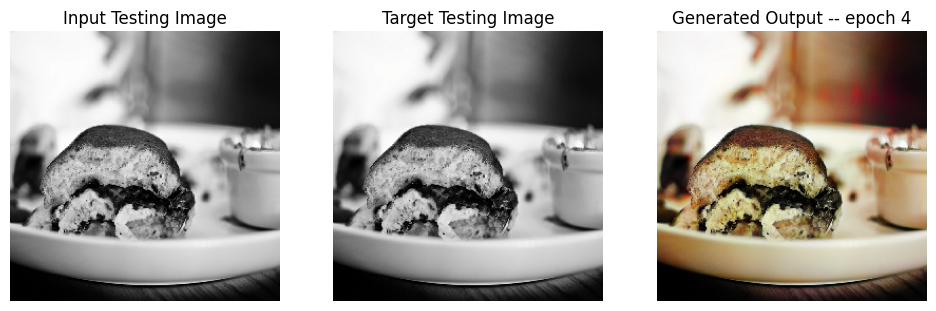

SSIM Score: 0.9382810592651367
PSNR Score: 20.87212371826172
Epoch 4
Training Details
Generator-- total_loss:9.41556 gan_loss:1.08899 l1_loss:0.04665 perceptual_loss:0.00886 Discriminator-- total_loss:1.21353 real_loss:0.58027 generated_loss:0.63326 --- SSIM 0.89346 PSNR 22.02358 LPIPS 0.00000
Time taken for epoch 5 is 613.2059271335602 sec
Number of iteration 500
Validation Details
Generator-- total_loss:9.87416 gan_loss:1.00240 l1_loss:0.04906  perceptual_loss:0.01008 Discriminator-- total_loss:1.52258 real_loss:0.52071 generated_loss:1.00186 --- SSIM 0.89776 PSNR 21.97847 LPIPS 0.00000
Time taken for epoch 5 is 655.2445421218872 sec
Number of iteration 63
Epoch 5
Training Details
Generator-- total_loss:9.38722 gan_loss:1.08255 l1_loss:0.04641 perceptual_loss:0.00895 Discriminator-- total_loss:1.21296 real_loss:0.57644 generated_loss:0.63652 --- SSIM 0.89301 PSNR 22.00590 LPIPS 0.00000
Time taken for epoch 6 is 605.3232719898224 sec
Number of iteration 500
Validation Details
Generato

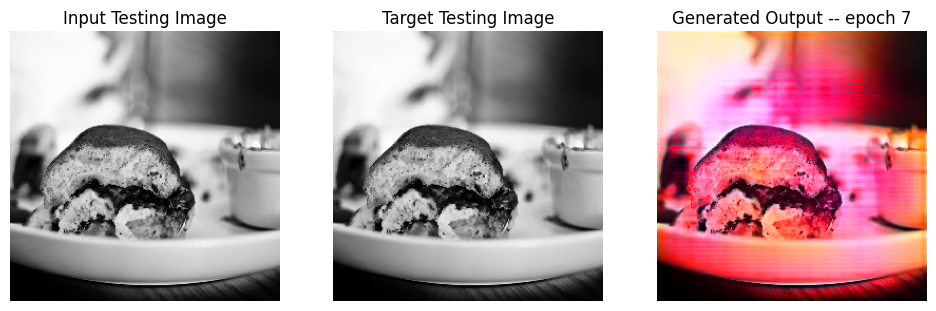

SSIM Score: 0.6458368897438049
PSNR Score: 11.576891899108887
Epoch 7
Training Details
Generator-- total_loss:9.45814 gan_loss:1.08881 l1_loss:0.04677 perceptual_loss:0.00902 Discriminator-- total_loss:1.19822 real_loss:0.57428 generated_loss:0.62393 --- SSIM 0.89080 PSNR 21.87915 LPIPS 0.00000
Time taken for epoch 8 is 598.7715752124786 sec
Number of iteration 500
Validation Details
Generator-- total_loss:10.08839 gan_loss:1.12372 l1_loss:0.04949  perceptual_loss:0.01028 Discriminator-- total_loss:1.50756 real_loss:0.48134 generated_loss:1.02623 --- SSIM 0.89986 PSNR 21.99651 LPIPS 0.00000
Time taken for epoch 8 is 639.8370325565338 sec
Number of iteration 63
Epoch 8
Training Details
Generator-- total_loss:9.44553 gan_loss:1.12907 l1_loss:0.04649 perceptual_loss:0.00895 Discriminator-- total_loss:1.17909 real_loss:0.55796 generated_loss:0.62113 --- SSIM 0.89146 PSNR 21.96482 LPIPS 0.00000
Time taken for epoch 9 is 599.1050107479095 sec
Number of iteration 500
Validation Details
Genera

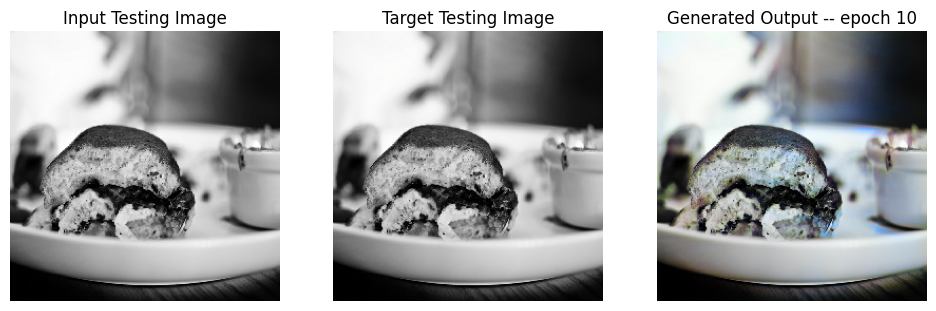

SSIM Score: 0.976224422454834
PSNR Score: 30.437191009521484
Epoch 10
Training Details
Generator-- total_loss:9.41272 gan_loss:1.28234 l1_loss:0.04492 perceptual_loss:0.00928 Discriminator-- total_loss:1.91770 real_loss:0.54189 generated_loss:1.37581 --- SSIM 0.89446 PSNR 21.44841 LPIPS 0.00000
Time taken for epoch 11 is 541.3068010807037 sec
Number of iteration 500
Validation Details
Generator-- total_loss:9.72574 gan_loss:1.43966 l1_loss:0.04546  perceptual_loss:0.00978 Discriminator-- total_loss:1.74844 real_loss:0.32077 generated_loss:1.42768 --- SSIM 0.90475 PSNR 23.04068 LPIPS 0.00000
Time taken for epoch 11 is 581.7464485168457 sec
Number of iteration 63
Epoch 11
Training Details
Generator-- total_loss:15.82984 gan_loss:7.90026 l1_loss:0.04353 perceptual_loss:0.00934 Discriminator-- total_loss:0.03468 real_loss:0.01312 generated_loss:0.02156 --- SSIM 0.90028 PSNR 21.54792 LPIPS 0.00000
Time taken for epoch 12 is 400.0298590660095 sec
Number of iteration 500
Validation Details
Ge

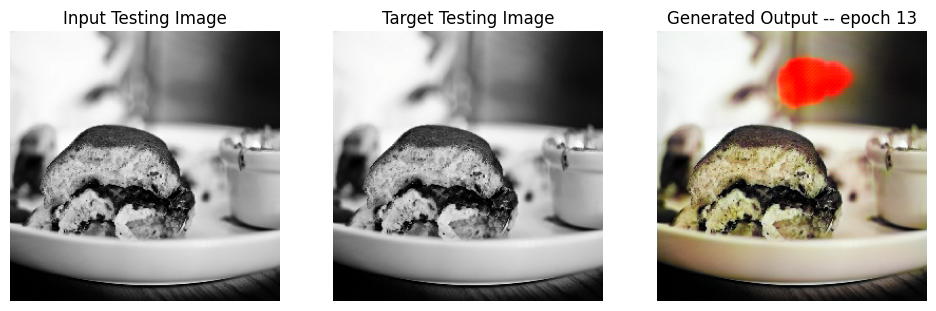

SSIM Score: 0.9212841987609863
PSNR Score: 16.388072967529297
Epoch 13
Training Details
Generator-- total_loss:18.97304 gan_loss:10.95205 l1_loss:0.04411 perceptual_loss:0.00936 Discriminator-- total_loss:0.00051 real_loss:0.00024 generated_loss:0.00027 --- SSIM 0.89875 PSNR 21.43196 LPIPS 0.00000
Time taken for epoch 14 is 397.59314489364624 sec
Number of iteration 500
Validation Details
Generator-- total_loss:10.84420 gan_loss:2.11837 l1_loss:0.04841  perceptual_loss:0.00976 Discriminator-- total_loss:1.36797 real_loss:0.42186 generated_loss:0.94611 --- SSIM 0.89818 PSNR 22.57804 LPIPS 0.00000
Time taken for epoch 14 is 437.98259139060974 sec
Number of iteration 63
Epoch 14
Training Details
Generator-- total_loss:20.44043 gan_loss:12.47192 l1_loss:0.04383 perceptual_loss:0.00929 Discriminator-- total_loss:0.00018 real_loss:0.00009 generated_loss:0.00009 --- SSIM 0.90011 PSNR 21.56054 LPIPS 0.00000
Time taken for epoch 15 is 397.5606164932251 sec
Number of iteration 500
Validation Det

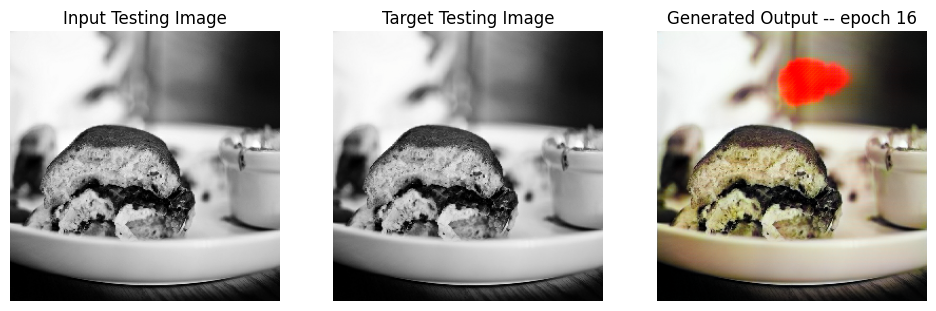

SSIM Score: 0.9260924458503723
PSNR Score: 17.144865036010742
Epoch 16
Training Details
Generator-- total_loss:19.96356 gan_loss:11.90858 l1_loss:0.04442 perceptual_loss:0.00928 Discriminator-- total_loss:0.00030 real_loss:0.00016 generated_loss:0.00014 --- SSIM 0.89870 PSNR 21.44810 LPIPS 0.00000
Time taken for epoch 17 is 399.6993525028229 sec
Number of iteration 500
Validation Details
Generator-- total_loss:12.43792 gan_loss:3.89464 l1_loss:0.04723  perceptual_loss:0.00973 Discriminator-- total_loss:2.30020 real_loss:0.11737 generated_loss:2.18283 --- SSIM 0.90012 PSNR 22.66079 LPIPS 0.00000
Time taken for epoch 17 is 440.3503587245941 sec
Number of iteration 63
Epoch 17
Training Details
Generator-- total_loss:21.40257 gan_loss:13.36821 l1_loss:0.04426 perceptual_loss:0.00930 Discriminator-- total_loss:0.00156 real_loss:0.00105 generated_loss:0.00050 --- SSIM 0.89914 PSNR 21.42949 LPIPS 0.00000
Time taken for epoch 18 is 397.7090268135071 sec
Number of iteration 500
Validation Detai

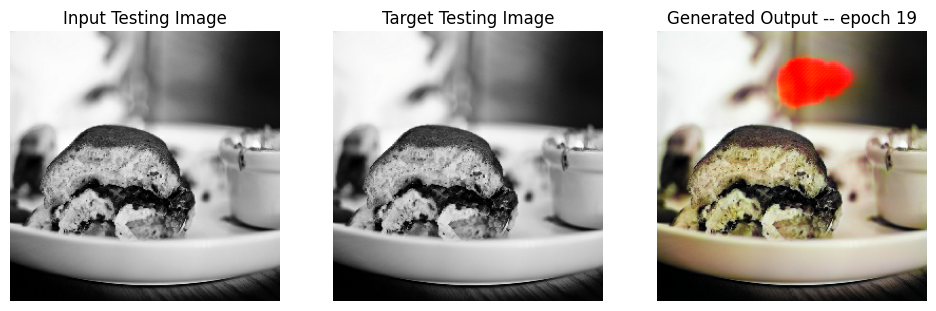

SSIM Score: 0.9209685325622559
PSNR Score: 16.33890151977539
Epoch 19
Training Details
Generator-- total_loss:25.97617 gan_loss:17.98340 l1_loss:0.04402 perceptual_loss:0.00927 Discriminator-- total_loss:0.21352 real_loss:0.12257 generated_loss:0.09095 --- SSIM 0.89980 PSNR 21.52229 LPIPS 0.00000
Time taken for epoch 20 is 396.42586755752563 sec
Number of iteration 500
Validation Details
Generator-- total_loss:18.09811 gan_loss:9.47106 l1_loss:0.04788  perceptual_loss:0.00964 Discriminator-- total_loss:7.93018 real_loss:0.03972 generated_loss:7.89047 --- SSIM 0.90069 PSNR 22.64898 LPIPS 0.00000
Time taken for epoch 20 is 436.6490035057068 sec
Number of iteration 63
Epoch 20
Training Details
Generator-- total_loss:28.78500 gan_loss:20.78487 l1_loss:0.04404 perceptual_loss:0.00929 Discriminator-- total_loss:0.00435 real_loss:0.00216 generated_loss:0.00220 --- SSIM 0.89962 PSNR 21.46096 LPIPS 0.00000
Time taken for epoch 21 is 398.3698921203613 sec
Number of iteration 500
Validation Detai

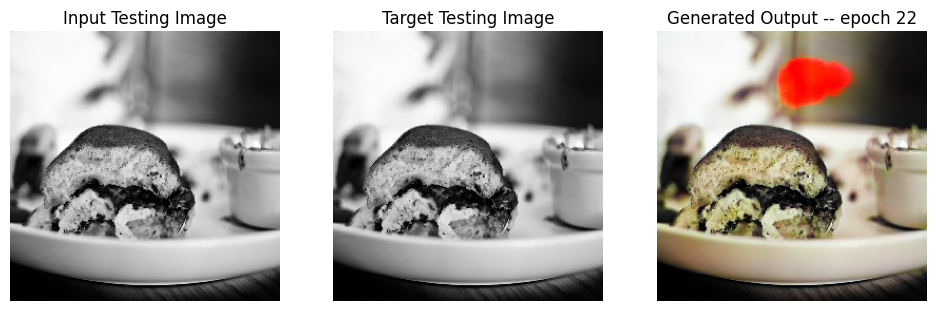

SSIM Score: 0.9233164191246033
PSNR Score: 16.587846755981445
Epoch 22
Training Details
Generator-- total_loss:26.93438 gan_loss:19.01999 l1_loss:0.04346 perceptual_loss:0.00931 Discriminator-- total_loss:0.00005 real_loss:0.00003 generated_loss:0.00002 --- SSIM 0.90020 PSNR 21.54602 LPIPS 0.00000
Time taken for epoch 23 is 397.79513931274414 sec
Number of iteration 500
Validation Details
Generator-- total_loss:15.40928 gan_loss:6.84590 l1_loss:0.04714  perceptual_loss:0.00995 Discriminator-- total_loss:5.41158 real_loss:0.19715 generated_loss:5.21443 --- SSIM 0.90047 PSNR 22.60296 LPIPS 0.00000
Time taken for epoch 23 is 438.322548866272 sec
Number of iteration 63
Epoch 23
Training Details
Generator-- total_loss:27.36125 gan_loss:19.37525 l1_loss:0.04397 perceptual_loss:0.00927 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.89951 PSNR 21.44531 LPIPS 0.00000
Time taken for epoch 24 is 396.76902866363525 sec
Number of iteration 500
Validation Deta

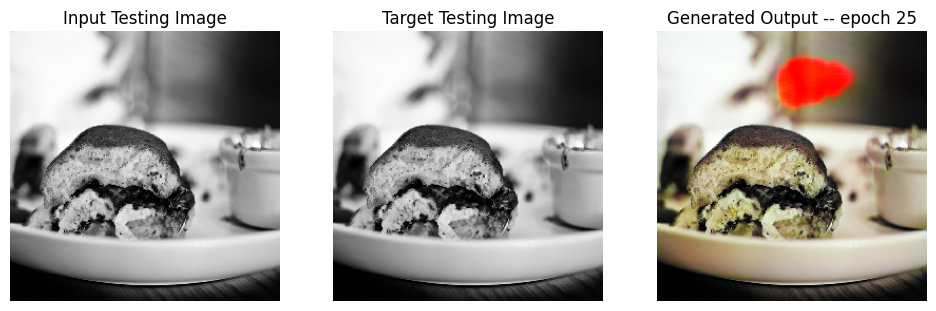

SSIM Score: 0.9202852845191956
PSNR Score: 16.251426696777344
Epoch 25
Training Details
Generator-- total_loss:31.29573 gan_loss:23.31686 l1_loss:0.04384 perceptual_loss:0.00935 Discriminator-- total_loss:0.01232 real_loss:0.00710 generated_loss:0.00521 --- SSIM 0.89921 PSNR 21.50244 LPIPS 0.00000
Time taken for epoch 26 is 400.5060844421387 sec
Number of iteration 500
Validation Details
Generator-- total_loss:12.78935 gan_loss:4.26724 l1_loss:0.04711  perceptual_loss:0.00970 Discriminator-- total_loss:4.74208 real_loss:2.25335 generated_loss:2.48874 --- SSIM 0.89998 PSNR 22.65843 LPIPS 0.00000
Time taken for epoch 26 is 440.52913880348206 sec
Number of iteration 63
Epoch 26
Training Details
Generator-- total_loss:30.33680 gan_loss:22.30088 l1_loss:0.04425 perceptual_loss:0.00933 Discriminator-- total_loss:0.00132 real_loss:0.00078 generated_loss:0.00054 --- SSIM 0.89887 PSNR 21.45967 LPIPS 0.00000
Time taken for epoch 27 is 398.7961573600769 sec
Number of iteration 500
Validation Deta

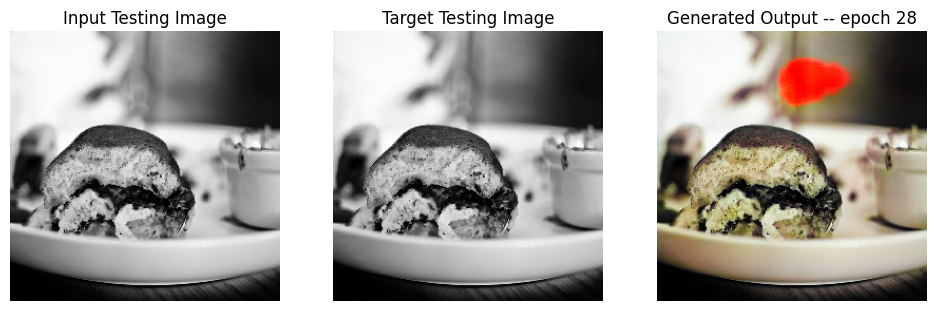

SSIM Score: 0.9273481965065002
PSNR Score: 17.22600555419922
Epoch 28
Training Details
Generator-- total_loss:30.97915 gan_loss:23.03643 l1_loss:0.04372 perceptual_loss:0.00924 Discriminator-- total_loss:0.00225 real_loss:0.00124 generated_loss:0.00102 --- SSIM 0.90021 PSNR 21.56438 LPIPS 0.00000
Time taken for epoch 29 is 397.820520401001 sec
Number of iteration 500
Validation Details
Generator-- total_loss:15.73495 gan_loss:7.27124 l1_loss:0.04692  perceptual_loss:0.00951 Discriminator-- total_loss:5.37811 real_loss:0.29340 generated_loss:5.08471 --- SSIM 0.90024 PSNR 22.75850 LPIPS 0.00000
Time taken for epoch 29 is 438.0256998538971 sec
Number of iteration 63
Epoch 29
Training Details
Generator-- total_loss:29.34176 gan_loss:21.28198 l1_loss:0.04443 perceptual_loss:0.00930 Discriminator-- total_loss:0.00008 real_loss:0.00004 generated_loss:0.00004 --- SSIM 0.89867 PSNR 21.42087 LPIPS 0.00000
Time taken for epoch 30 is 398.8851013183594 sec
Number of iteration 500
Validation Details

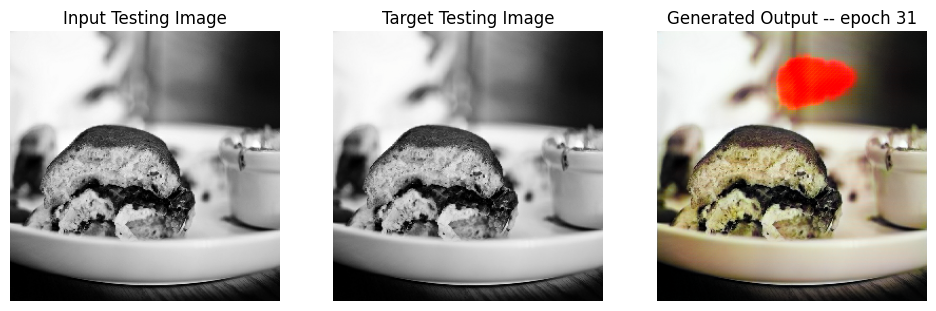

SSIM Score: 0.9159604907035828
PSNR Score: 15.806708335876465
Epoch 31
Training Details
Generator-- total_loss:30.96781 gan_loss:22.99876 l1_loss:0.04382 perceptual_loss:0.00931 Discriminator-- total_loss:0.00015 real_loss:0.00015 generated_loss:0.00000 --- SSIM 0.90056 PSNR 21.47737 LPIPS 0.00000
Time taken for epoch 32 is 401.05605721473694 sec
Number of iteration 500
Validation Details
Generator-- total_loss:16.46330 gan_loss:7.64253 l1_loss:0.04863  perceptual_loss:0.01018 Discriminator-- total_loss:6.81531 real_loss:0.30301 generated_loss:6.51230 --- SSIM 0.89872 PSNR 22.50438 LPIPS 0.00000
Time taken for epoch 32 is 441.53617334365845 sec
Number of iteration 63
Reduced generator learning rate to 0.0004500000213738531 at epoch 32
Epoch 32
Training Details
Generator-- total_loss:7.17973 gan_loss:0.17593 l1_loss:0.03862 perceptual_loss:0.00807 Discriminator-- total_loss:81.99894 real_loss:81.99893 generated_loss:0.00000 --- SSIM 0.91968 PSNR 23.83851 LPIPS 0.00000
Time taken for epo

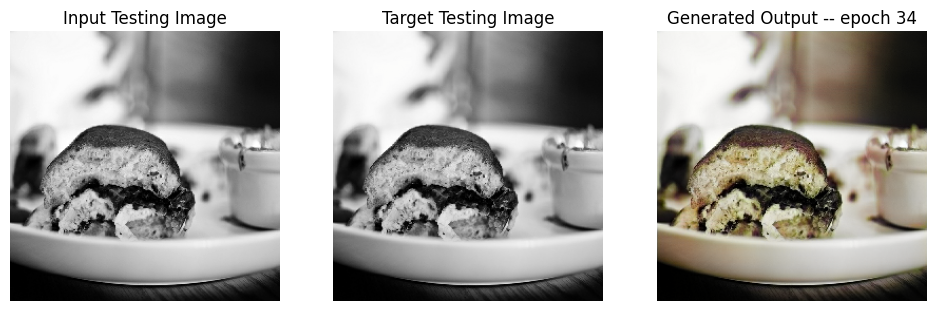

SSIM Score: 0.981501042842865
PSNR Score: 26.197429656982422
Epoch 34
Training Details
Generator-- total_loss:6.94278 gan_loss:0.00000 l1_loss:0.03840 perceptual_loss:0.00788 Discriminator-- total_loss:83.01640 real_loss:83.01640 generated_loss:0.00000 --- SSIM 0.92296 PSNR 23.91722 LPIPS 0.00000
Time taken for epoch 35 is 535.9184935092926 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.35337 gan_loss:0.00071 l1_loss:0.04649  perceptual_loss:0.00919 Discriminator-- total_loss:60.61146 real_loss:60.61146 generated_loss:0.00000 --- SSIM 0.91610 PSNR 22.79707 LPIPS 0.00000
Time taken for epoch 35 is 576.2162399291992 sec
Number of iteration 63
Epoch 35
Training Details
Generator-- total_loss:6.98540 gan_loss:0.00000 l1_loss:0.03857 perceptual_loss:0.00800 Discriminator-- total_loss:82.81969 real_loss:82.81967 generated_loss:0.00001 --- SSIM 0.92182 PSNR 23.84605 LPIPS 0.00000
Time taken for epoch 36 is 535.5151584148407 sec
Number of iteration 500
Validation Detai

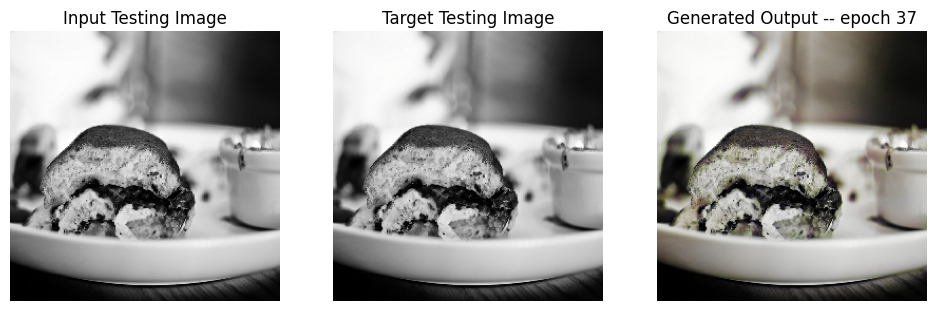

SSIM Score: 0.9940831065177917
PSNR Score: 33.263912200927734
Epoch 37
Training Details
Generator-- total_loss:6.92452 gan_loss:0.00000 l1_loss:0.03824 perceptual_loss:0.00792 Discriminator-- total_loss:83.58254 real_loss:83.58254 generated_loss:0.00000 --- SSIM 0.92295 PSNR 23.90185 LPIPS 0.00000
Time taken for epoch 38 is 537.406261920929 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.78686 gan_loss:0.00000 l1_loss:0.04312  perceptual_loss:0.00879 Discriminator-- total_loss:69.16241 real_loss:69.16241 generated_loss:0.00000 --- SSIM 0.91831 PSNR 23.22227 LPIPS 0.00000
Time taken for epoch 38 is 577.940675497055 sec
Number of iteration 63
Epoch 38
Training Details
Generator-- total_loss:6.91723 gan_loss:0.00000 l1_loss:0.03825 perceptual_loss:0.00787 Discriminator-- total_loss:83.22525 real_loss:83.22523 generated_loss:0.00002 --- SSIM 0.92308 PSNR 23.88482 LPIPS 0.00000
Time taken for epoch 39 is 536.4104516506195 sec
Number of iteration 500
Validation Detail

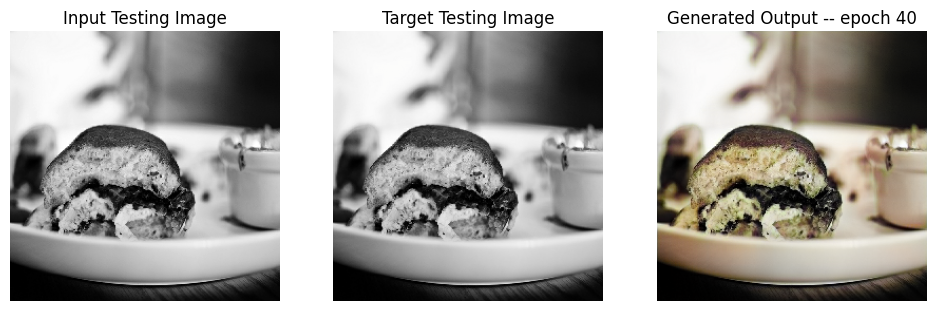

SSIM Score: 0.9818647503852844
PSNR Score: 25.307453155517578
Epoch 40
Training Details
Generator-- total_loss:6.96356 gan_loss:0.00000 l1_loss:0.03850 perceptual_loss:0.00793 Discriminator-- total_loss:82.71181 real_loss:82.71181 generated_loss:0.00001 --- SSIM 0.92234 PSNR 23.90093 LPIPS 0.00000
Time taken for epoch 41 is 534.8600189685822 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.71729 gan_loss:0.00000 l1_loss:0.04267  perceptual_loss:0.00878 Discriminator-- total_loss:69.28912 real_loss:69.28912 generated_loss:0.00000 --- SSIM 0.92114 PSNR 23.35798 LPIPS 0.00000
Time taken for epoch 41 is 575.5832035541534 sec
Number of iteration 63
Epoch 41
Training Details
Generator-- total_loss:6.88107 gan_loss:0.00000 l1_loss:0.03801 perceptual_loss:0.00786 Discriminator-- total_loss:82.32365 real_loss:82.32365 generated_loss:0.00000 --- SSIM 0.92308 PSNR 23.92022 LPIPS 0.00000
Time taken for epoch 42 is 532.5253257751465 sec
Number of iteration 500
Validation Deta

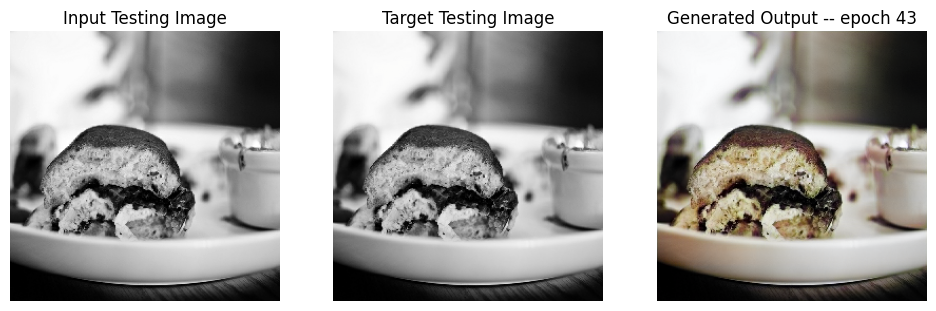

SSIM Score: 0.9858974814414978
PSNR Score: 27.72283172607422
Epoch 43
Training Details
Generator-- total_loss:6.84261 gan_loss:0.00000 l1_loss:0.03781 perceptual_loss:0.00781 Discriminator-- total_loss:82.66708 real_loss:82.66708 generated_loss:0.00000 --- SSIM 0.92398 PSNR 23.94195 LPIPS 0.00000
Time taken for epoch 44 is 536.3800747394562 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.62034 gan_loss:0.00000 l1_loss:0.04195  perceptual_loss:0.00885 Discriminator-- total_loss:63.82606 real_loss:63.82606 generated_loss:0.00000 --- SSIM 0.92219 PSNR 23.51883 LPIPS 0.00000
Time taken for epoch 44 is 577.1168732643127 sec
Number of iteration 63
Epoch 44
Training Details
Generator-- total_loss:6.85188 gan_loss:0.00000 l1_loss:0.03784 perceptual_loss:0.00784 Discriminator-- total_loss:84.62328 real_loss:84.62328 generated_loss:0.00000 --- SSIM 0.92328 PSNR 23.98938 LPIPS 0.00000
Time taken for epoch 45 is 536.8700935840607 sec
Number of iteration 500
Validation Detai

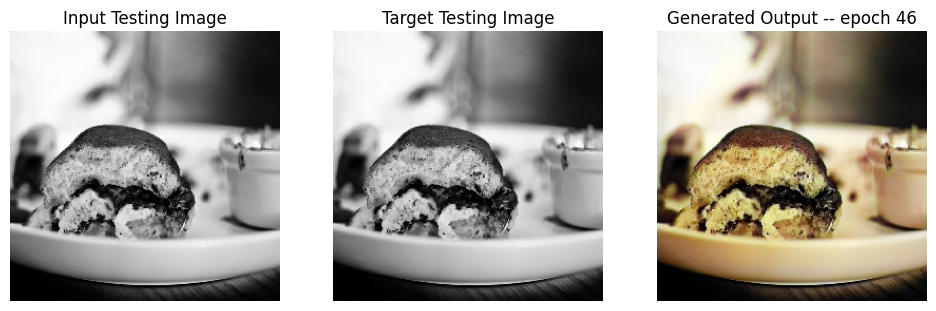

SSIM Score: 0.9566883444786072
PSNR Score: 20.632476806640625
Epoch 46
Training Details
Generator-- total_loss:6.89515 gan_loss:0.00000 l1_loss:0.03807 perceptual_loss:0.00790 Discriminator-- total_loss:82.96648 real_loss:82.96648 generated_loss:0.00000 --- SSIM 0.92248 PSNR 23.87786 LPIPS 0.00000
Time taken for epoch 47 is 534.9966335296631 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.71660 gan_loss:0.00000 l1_loss:0.04228  perceptual_loss:0.00916 Discriminator-- total_loss:63.88269 real_loss:63.88269 generated_loss:0.00000 --- SSIM 0.92022 PSNR 23.58788 LPIPS 0.00000
Time taken for epoch 47 is 576.2107520103455 sec
Number of iteration 63
Epoch 47
Training Details
Generator-- total_loss:6.90934 gan_loss:0.00000 l1_loss:0.03821 perceptual_loss:0.00785 Discriminator-- total_loss:84.25280 real_loss:84.25280 generated_loss:0.00000 --- SSIM 0.92279 PSNR 23.89076 LPIPS 0.00000
Time taken for epoch 48 is 536.9155445098877 sec
Number of iteration 500
Validation Deta

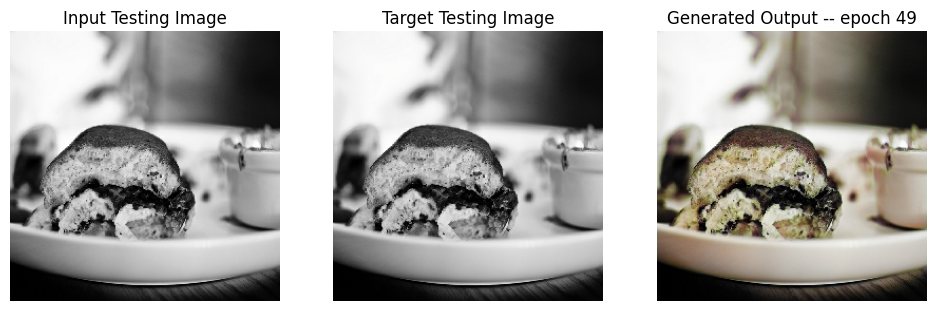

SSIM Score: 0.9855087399482727
PSNR Score: 27.362855911254883
Epoch 49
Training Details
Generator-- total_loss:6.91091 gan_loss:0.00000 l1_loss:0.03826 perceptual_loss:0.00781 Discriminator-- total_loss:83.45685 real_loss:83.45683 generated_loss:0.00002 --- SSIM 0.92251 PSNR 23.89701 LPIPS 0.00000
Time taken for epoch 50 is 536.3048994541168 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.06854 gan_loss:0.00000 l1_loss:0.04470  perceptual_loss:0.00909 Discriminator-- total_loss:70.35193 real_loss:70.35193 generated_loss:0.00000 --- SSIM 0.91524 PSNR 23.05883 LPIPS 0.00000
Time taken for epoch 50 is 576.4939041137695 sec
Number of iteration 63
Epoch 50
Training Details
Generator-- total_loss:6.83566 gan_loss:0.00000 l1_loss:0.03782 perceptual_loss:0.00775 Discriminator-- total_loss:83.77430 real_loss:83.77428 generated_loss:0.00002 --- SSIM 0.92319 PSNR 23.99550 LPIPS 0.00000
Time taken for epoch 51 is 537.294527053833 sec
Number of iteration 500
Validation Detai

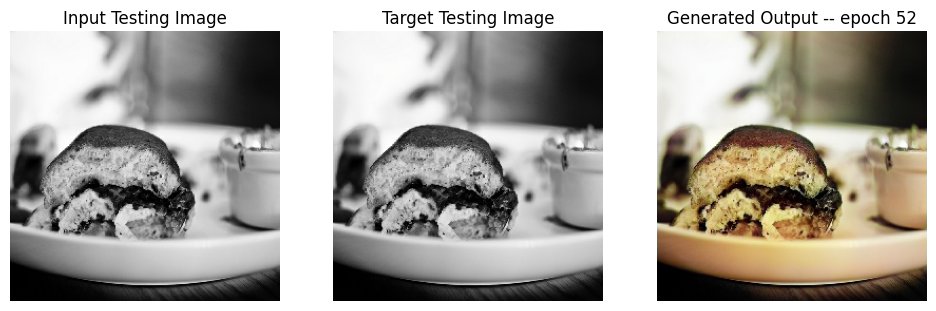

SSIM Score: 0.9587211012840271
PSNR Score: 20.86074447631836
Epoch 52
Training Details
Generator-- total_loss:6.82457 gan_loss:0.00000 l1_loss:0.03772 perceptual_loss:0.00778 Discriminator-- total_loss:84.12732 real_loss:84.12730 generated_loss:0.00002 --- SSIM 0.92327 PSNR 24.01976 LPIPS 0.00000
Time taken for epoch 53 is 535.3314695358276 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.03321 gan_loss:0.00000 l1_loss:0.04434  perceptual_loss:0.00921 Discriminator-- total_loss:69.87229 real_loss:69.87229 generated_loss:0.00000 --- SSIM 0.91593 PSNR 23.15318 LPIPS 0.00000
Time taken for epoch 53 is 576.5392601490021 sec
Number of iteration 63
Epoch 53
Training Details
Generator-- total_loss:6.89994 gan_loss:0.00000 l1_loss:0.03820 perceptual_loss:0.00780 Discriminator-- total_loss:84.43739 real_loss:84.43739 generated_loss:0.00000 --- SSIM 0.92313 PSNR 23.90745 LPIPS 0.00000
Time taken for epoch 54 is 539.7358555793762 sec
Number of iteration 500
Validation Detai

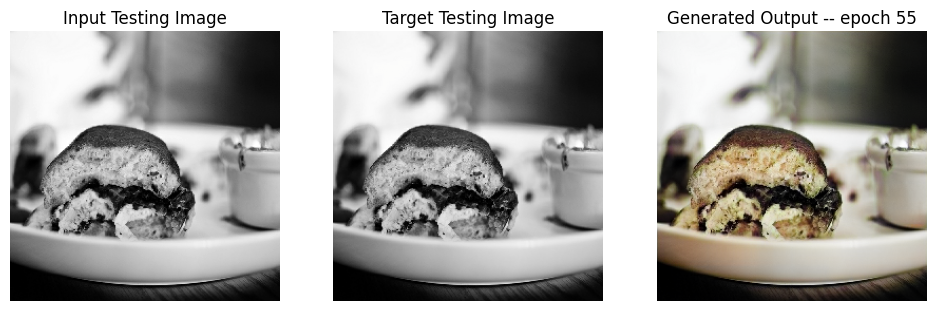

SSIM Score: 0.9825213551521301
PSNR Score: 26.071453094482422
Epoch 55
Training Details
Generator-- total_loss:6.85356 gan_loss:0.00000 l1_loss:0.03790 perceptual_loss:0.00779 Discriminator-- total_loss:83.23792 real_loss:83.23792 generated_loss:0.00000 --- SSIM 0.92275 PSNR 23.94047 LPIPS 0.00000
Time taken for epoch 56 is 545.4488995075226 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.57742 gan_loss:0.00000 l1_loss:0.04610  perceptual_loss:0.01108 Discriminator-- total_loss:72.70147 real_loss:72.70147 generated_loss:0.00000 --- SSIM 0.91846 PSNR 23.10769 LPIPS 0.00000
Time taken for epoch 56 is 585.5320637226105 sec
Number of iteration 63
Epoch 56
Training Details
Generator-- total_loss:6.91150 gan_loss:0.00000 l1_loss:0.03827 perceptual_loss:0.00781 Discriminator-- total_loss:83.66697 real_loss:83.66697 generated_loss:0.00000 --- SSIM 0.92295 PSNR 23.91288 LPIPS 0.00000
Time taken for epoch 57 is 544.6715984344482 sec
Number of iteration 500
Validation Deta

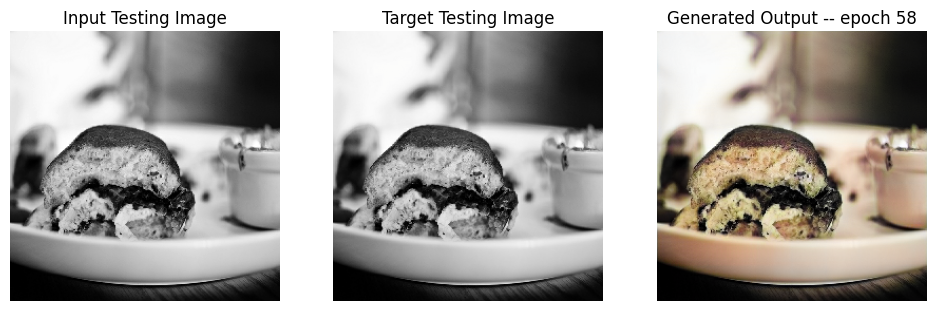

SSIM Score: 0.9799701571464539
PSNR Score: 23.919145584106445
Epoch 58
Training Details
Generator-- total_loss:6.77710 gan_loss:0.00000 l1_loss:0.03740 perceptual_loss:0.00778 Discriminator-- total_loss:82.24466 real_loss:82.24464 generated_loss:0.00001 --- SSIM 0.92500 PSNR 24.07139 LPIPS 0.00000
Time taken for epoch 59 is 542.9866166114807 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.83822 gan_loss:0.00000 l1_loss:0.04339  perceptual_loss:0.00886 Discriminator-- total_loss:70.26442 real_loss:70.26442 generated_loss:0.00000 --- SSIM 0.91752 PSNR 23.08443 LPIPS 0.00000
Time taken for epoch 59 is 583.4216272830963 sec
Number of iteration 63
Epoch 59
Training Details
Generator-- total_loss:6.91548 gan_loss:0.00000 l1_loss:0.03824 perceptual_loss:0.00787 Discriminator-- total_loss:85.55830 real_loss:85.55830 generated_loss:0.00000 --- SSIM 0.92227 PSNR 23.90680 LPIPS 0.00000
Time taken for epoch 60 is 544.1426045894623 sec
Number of iteration 500
Validation Deta

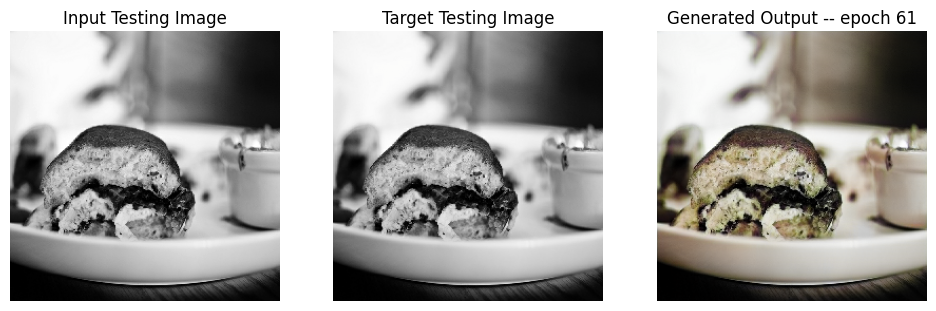

SSIM Score: 0.9878353476524353
PSNR Score: 28.025774002075195
Epoch 61
Training Details
Generator-- total_loss:6.92421 gan_loss:0.00000 l1_loss:0.03836 perceptual_loss:0.00780 Discriminator-- total_loss:83.09460 real_loss:83.09459 generated_loss:0.00000 --- SSIM 0.92191 PSNR 23.90008 LPIPS 0.00000
Time taken for epoch 62 is 545.7292017936707 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.89914 gan_loss:0.00000 l1_loss:0.04380  perceptual_loss:0.00887 Discriminator-- total_loss:63.31004 real_loss:63.31003 generated_loss:0.00000 --- SSIM 0.92141 PSNR 23.33368 LPIPS 0.00000
Time taken for epoch 62 is 585.972992181778 sec
Number of iteration 63
Epoch 62
Training Details
Generator-- total_loss:6.84976 gan_loss:0.00000 l1_loss:0.03795 perceptual_loss:0.00771 Discriminator-- total_loss:83.63714 real_loss:83.63713 generated_loss:0.00000 --- SSIM 0.92324 PSNR 23.97923 LPIPS 0.00000
Time taken for epoch 63 is 546.0424349308014 sec
Number of iteration 500
Validation Detai

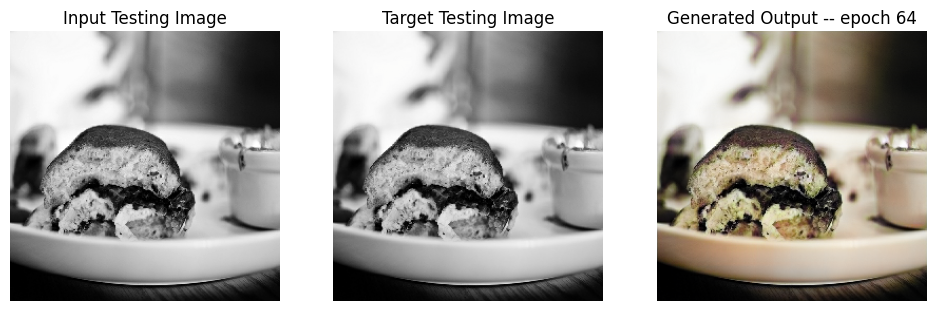

SSIM Score: 0.9803757071495056
PSNR Score: 24.930927276611328
Epoch 64
Training Details
Generator-- total_loss:6.82307 gan_loss:0.00000 l1_loss:0.03771 perceptual_loss:0.00777 Discriminator-- total_loss:81.42423 real_loss:81.42423 generated_loss:0.00000 --- SSIM 0.92377 PSNR 24.03304 LPIPS 0.00000
Time taken for epoch 65 is 548.1816999912262 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.70597 gan_loss:0.00000 l1_loss:0.04236  perceptual_loss:0.00901 Discriminator-- total_loss:58.51882 real_loss:58.51882 generated_loss:0.00000 --- SSIM 0.92067 PSNR 23.51471 LPIPS 0.00000
Time taken for epoch 65 is 588.80100274086 sec
Number of iteration 63
Epoch 65
Training Details
Generator-- total_loss:6.89539 gan_loss:0.00000 l1_loss:0.03818 perceptual_loss:0.00779 Discriminator-- total_loss:82.06567 real_loss:82.06567 generated_loss:0.00000 --- SSIM 0.92224 PSNR 23.89366 LPIPS 0.00000
Time taken for epoch 66 is 544.895959854126 sec
Number of iteration 500
Validation Details

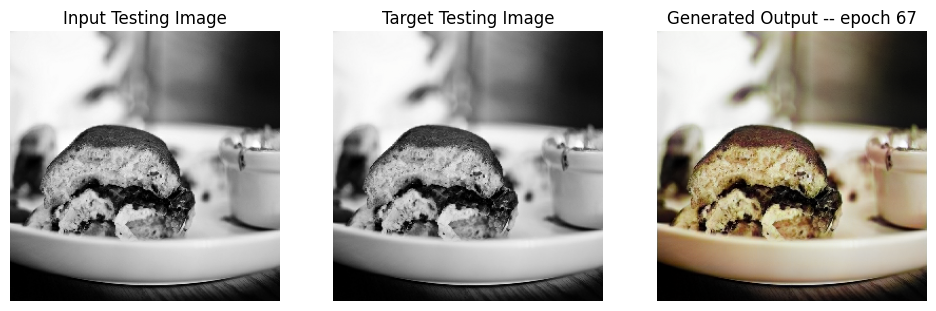

SSIM Score: 0.9703969955444336
PSNR Score: 23.503969192504883
Epoch 67
Training Details
Generator-- total_loss:6.83042 gan_loss:0.00000 l1_loss:0.03779 perceptual_loss:0.00774 Discriminator-- total_loss:83.72409 real_loss:83.72409 generated_loss:0.00000 --- SSIM 0.92324 PSNR 24.03400 LPIPS 0.00000
Time taken for epoch 68 is 545.1513586044312 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.77769 gan_loss:0.00000 l1_loss:0.04339  perceptual_loss:0.00846 Discriminator-- total_loss:59.68042 real_loss:59.68042 generated_loss:0.00000 --- SSIM 0.91887 PSNR 23.34452 LPIPS 0.00000
Time taken for epoch 68 is 585.6270267963409 sec
Number of iteration 63
Epoch 68
Training Details
Generator-- total_loss:6.79315 gan_loss:0.00000 l1_loss:0.03757 perceptual_loss:0.00771 Discriminator-- total_loss:82.22954 real_loss:82.22953 generated_loss:0.00000 --- SSIM 0.92373 PSNR 24.03702 LPIPS 0.00000
Time taken for epoch 69 is 541.9571740627289 sec
Number of iteration 500
Validation Deta

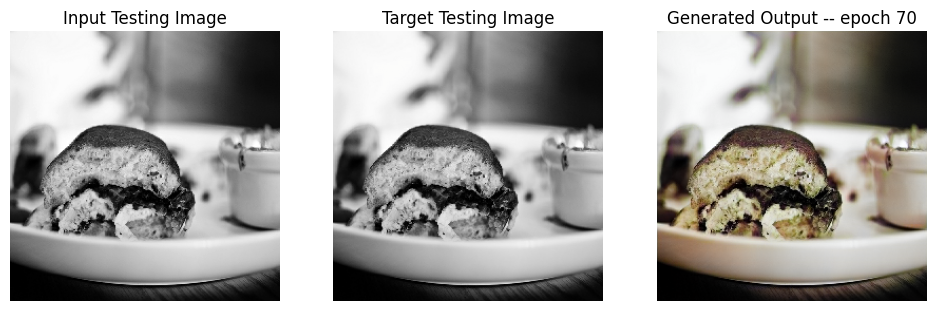

SSIM Score: 0.9827526211738586
PSNR Score: 26.73052215576172
Epoch 70
Training Details
Generator-- total_loss:6.82133 gan_loss:0.00000 l1_loss:0.03772 perceptual_loss:0.00775 Discriminator-- total_loss:80.74994 real_loss:80.74992 generated_loss:0.00000 --- SSIM 0.92365 PSNR 23.99743 LPIPS 0.00000
Time taken for epoch 71 is 545.0588781833649 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.78520 gan_loss:0.00000 l1_loss:0.04287  perceptual_loss:0.00903 Discriminator-- total_loss:61.37270 real_loss:61.37270 generated_loss:0.00000 --- SSIM 0.91792 PSNR 23.44871 LPIPS 0.00000
Time taken for epoch 71 is 585.2612986564636 sec
Number of iteration 63
Epoch 71
Training Details
Generator-- total_loss:6.85464 gan_loss:0.00000 l1_loss:0.03791 perceptual_loss:0.00779 Discriminator-- total_loss:81.72488 real_loss:81.72488 generated_loss:0.00000 --- SSIM 0.92260 PSNR 23.93128 LPIPS 0.00000
Time taken for epoch 72 is 543.8346185684204 sec
Number of iteration 500
Validation Detai

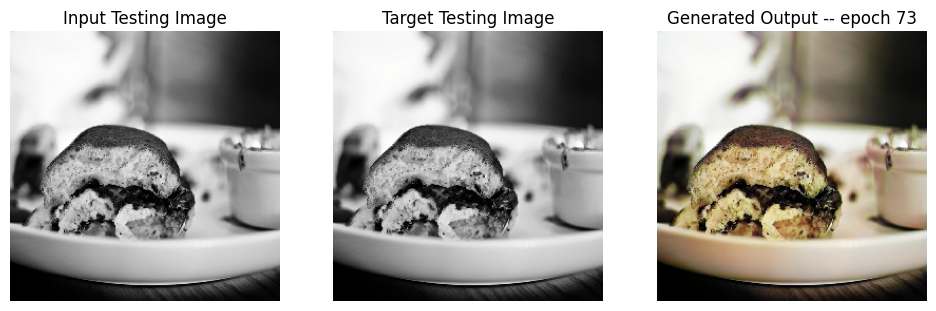

SSIM Score: 0.9737603068351746
PSNR Score: 23.614547729492188
Epoch 73
Training Details
Generator-- total_loss:6.91160 gan_loss:0.00000 l1_loss:0.03824 perceptual_loss:0.00784 Discriminator-- total_loss:83.21449 real_loss:83.21449 generated_loss:0.00000 --- SSIM 0.92212 PSNR 23.90520 LPIPS 0.00000
Time taken for epoch 74 is 547.1783337593079 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.67371 gan_loss:0.00000 l1_loss:0.04203  perceptual_loss:0.00913 Discriminator-- total_loss:65.68888 real_loss:65.68888 generated_loss:0.00000 --- SSIM 0.92151 PSNR 23.54529 LPIPS 0.00000
Time taken for epoch 74 is 587.767765045166 sec
Number of iteration 63
Epoch 74
Training Details
Generator-- total_loss:6.80535 gan_loss:0.00000 l1_loss:0.03767 perceptual_loss:0.00770 Discriminator-- total_loss:82.38577 real_loss:82.38577 generated_loss:0.00000 --- SSIM 0.92354 PSNR 24.00435 LPIPS 0.00000
Time taken for epoch 75 is 546.6490969657898 sec
Number of iteration 500
Validation Detai

In [50]:
fit(train_dataset, epochs, val, gen)

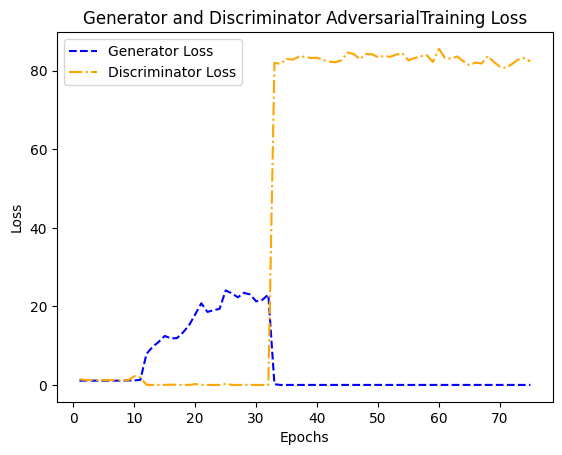

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator AdversarialTraining Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

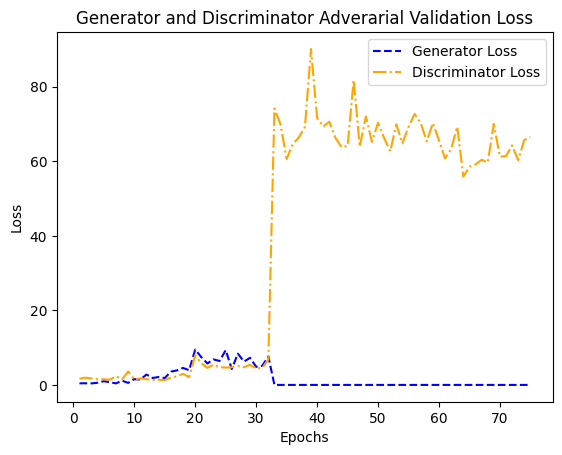

In [52]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator Adverarial Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

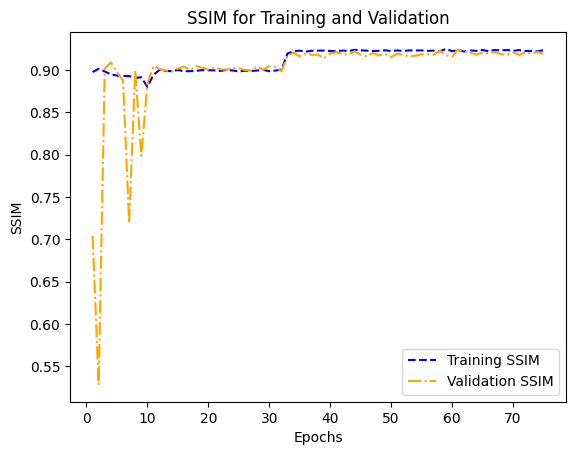

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.', color='orange', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

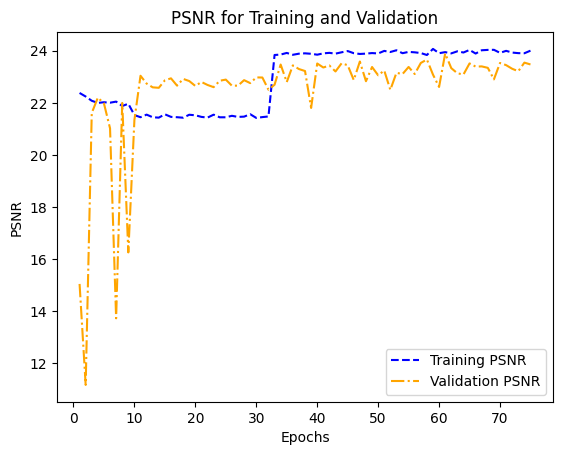

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.', color='orange', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

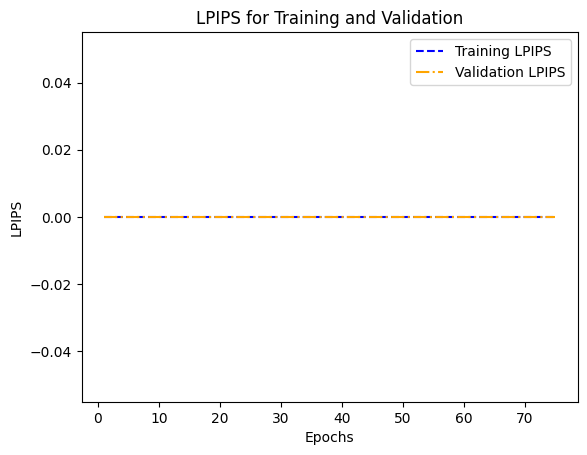

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training LPIPS')
plt.plot(epochs, testing_lpips, '-.', color='orange', label='Validation LPIPS')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

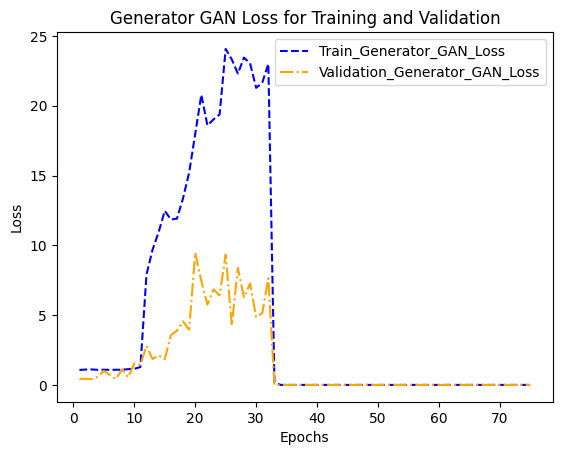

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses,'-.', color='orange', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

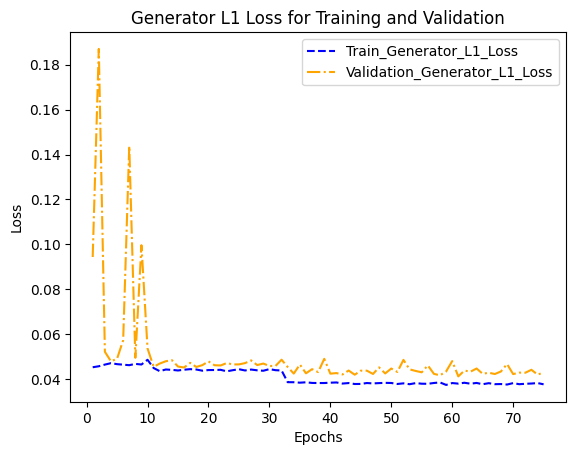

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.', color='orange', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

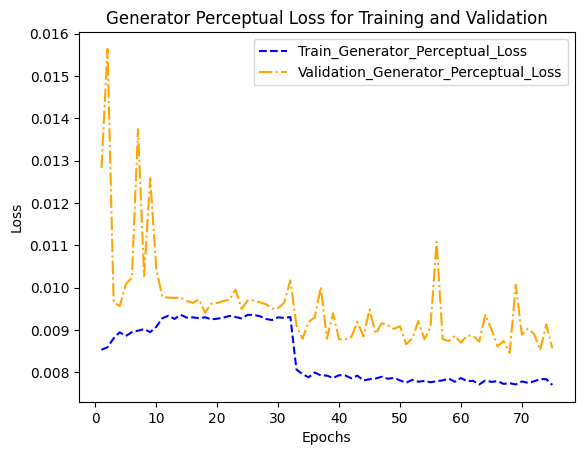

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-.', color='orange', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

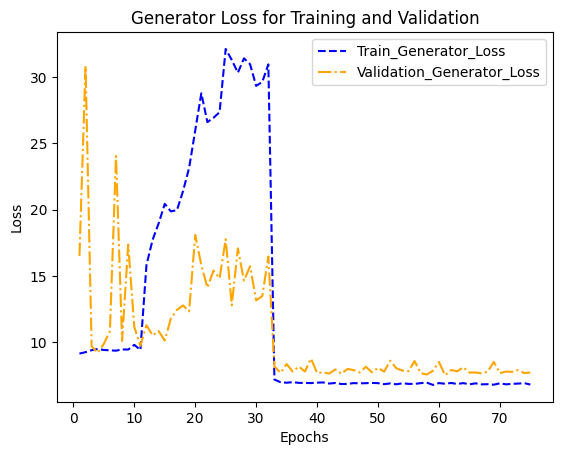

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.', color='orange', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

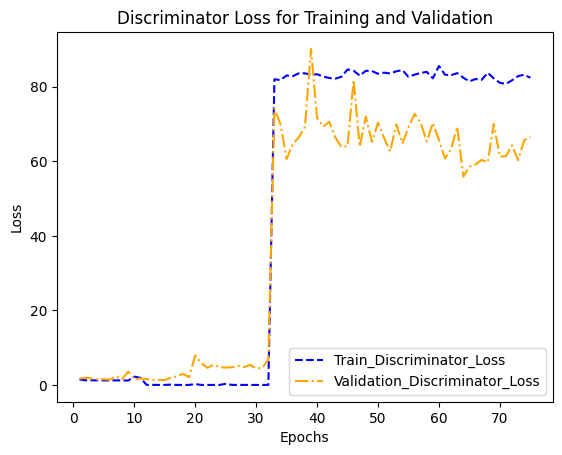

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

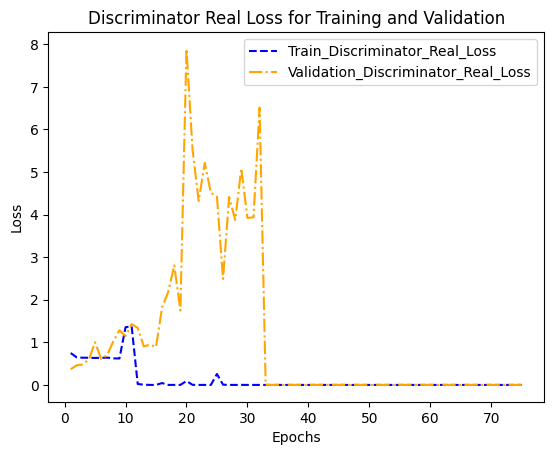

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.', color='orange', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

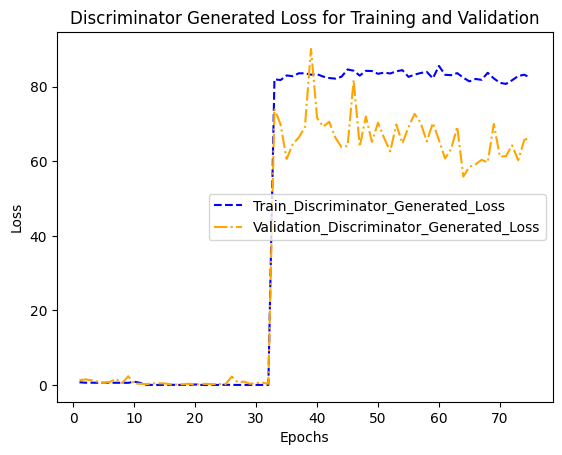

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses,'-.', color='orange', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [63]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [64]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [65]:
os.mkdir('/kaggle/working/modelsFeb7')

In [66]:
gen.save('/kaggle/working/modelsFeb7/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb7/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [67]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [68]:
import subprocess
from IPython.display import FileLink, display

In [69]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip